In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import json

In [2]:
sc.set_figure_params(dpi=200)

In [3]:
with open('/data/projects/robin/cell_free/proteomics_WGCNA/module_genes.json') as handle: # '/data/projects/robin/cell_free/prot_f/module_genes.json'
    dict_genes = json.loads(handle.read())

In [4]:
modules = ["MEblue", "MEbrown", "MEmagenta", "MEroyalblue"]

In [5]:
adata = sc.read("data/core_GBmap.h5ad")

In [6]:
data = adata.copy()
data.var_names = data.var.feature_name.tolist()

/opt/conda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


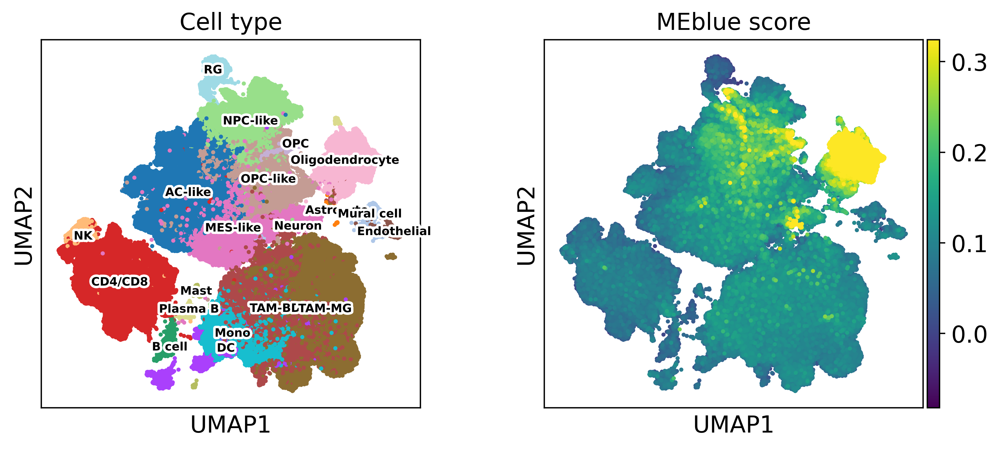

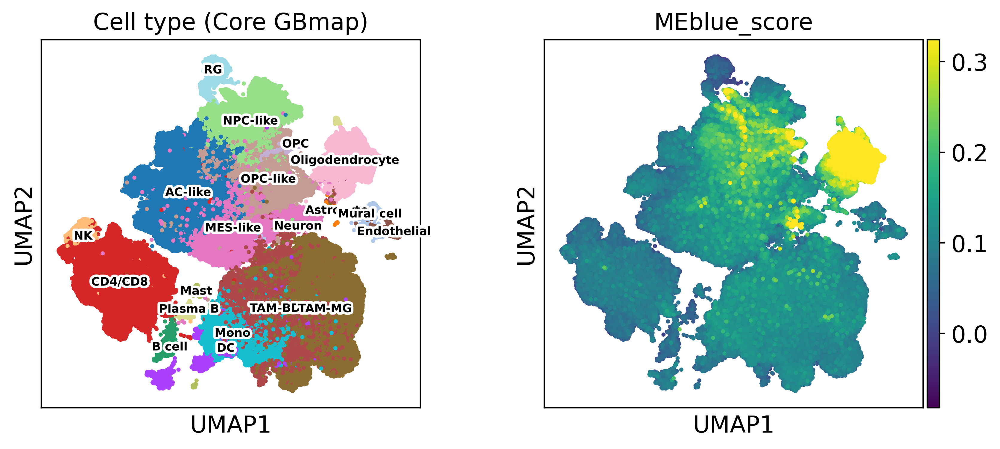

/opt/conda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


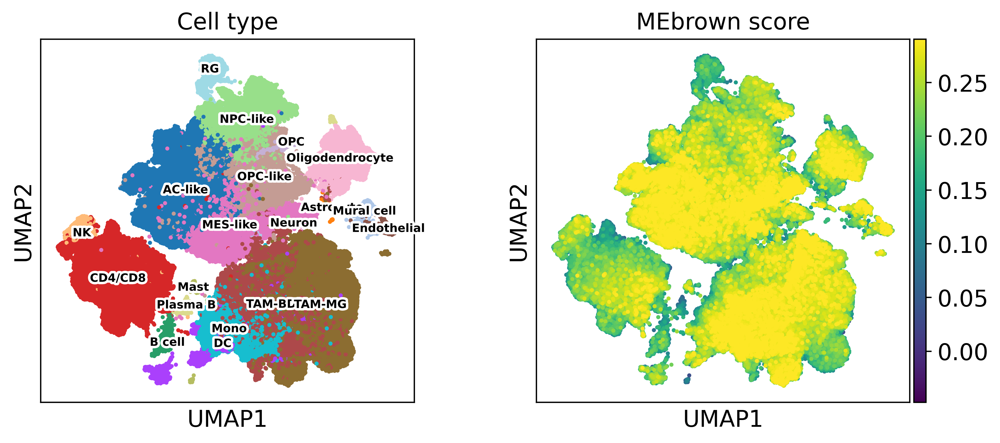

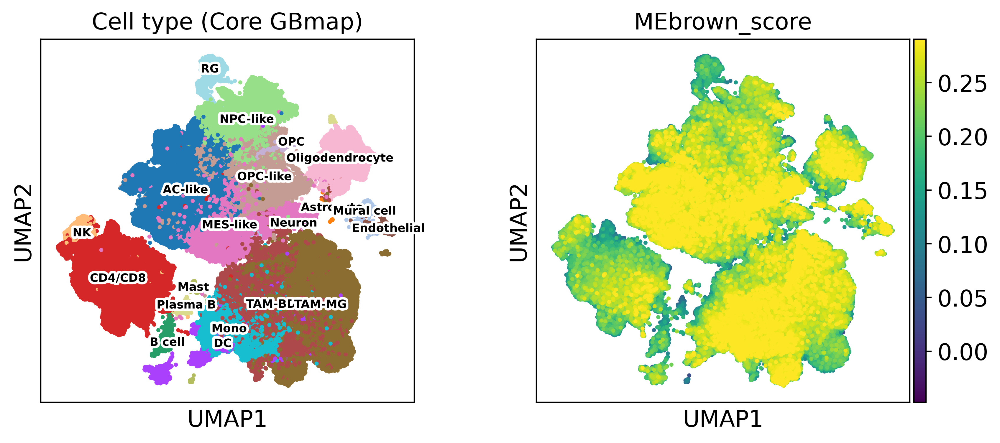

/opt/conda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


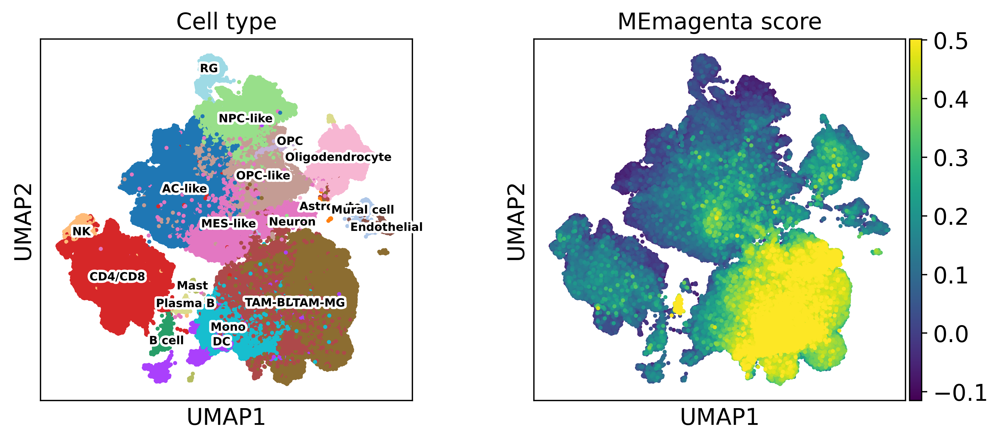

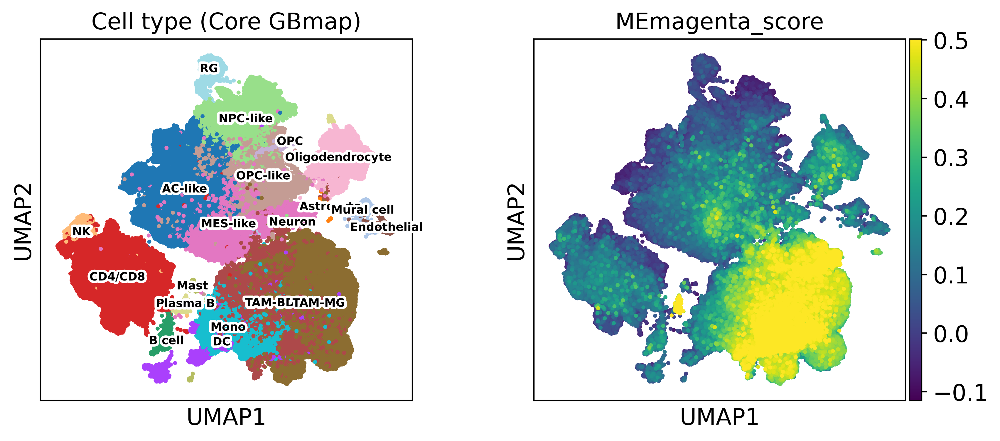

/opt/conda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


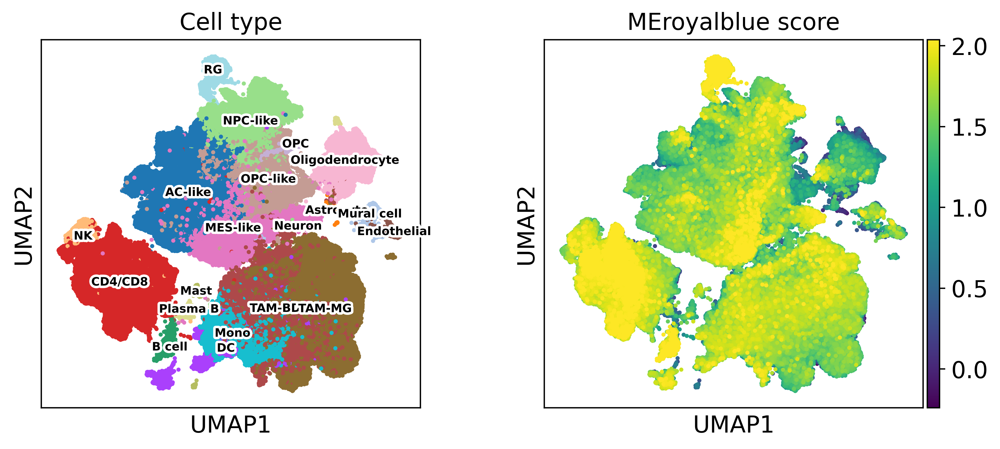

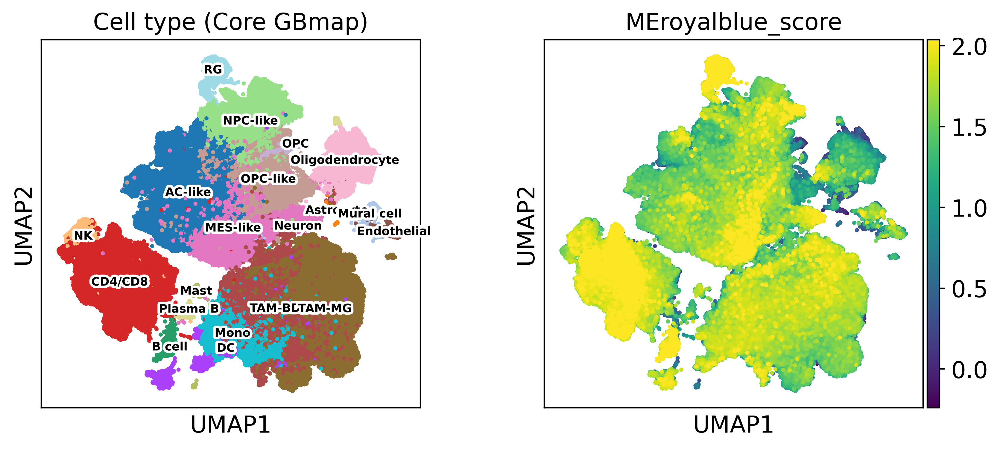

In [7]:
for module in modules:
    module_genes = dict_genes[module]
    sc.tl.score_genes(data, gene_list=[gene for gene in module_genes if gene in data.var_names], score_name="{}_score".format(module),
                 use_raw=False)
    sc.pl.umap(data, color=["annotation_level_3", "{}_score".format(module)], 
           cmap="viridis", 
           ncols=2,
           vmax="p99",
           legend_loc="on data",
           legend_fontsize=7, 
           legend_fontoutline=3, 
           s=25, 
           title=["Cell type", "{} score".format(module)], 
           save="core_GBmap_{}.pdf".format(module))
    sc.pl.umap(data, color=["annotation_level_3", "{}_score".format(module)], 
               cmap="viridis", 
               ncols=2, 
               vmax="p99", 
               legend_loc="on data",
               legend_fontsize=7, 
               legend_fontoutline=3, 
               s=25, 
               title=["Cell type (Core GBmap)", "{}_score".format(module)],
               save="core_GBmap_titled_{}.pdf".format(module))


# subset on cell types

In [28]:
cell_type = "malignant cell"
data = adata[adata.obs.cell_type==cell_type]

In [29]:
data.var_names = data.var.feature_name.tolist()

In [30]:
# sc.pp.scale(data)

/opt/conda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


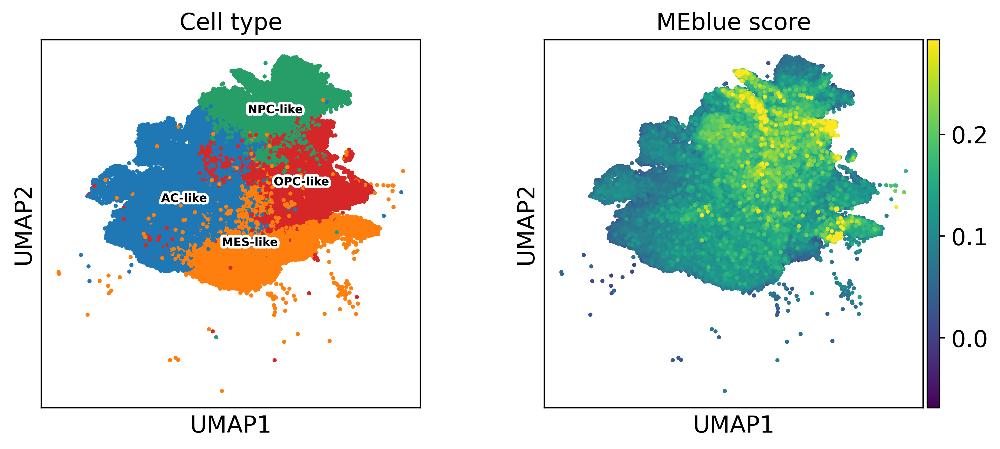

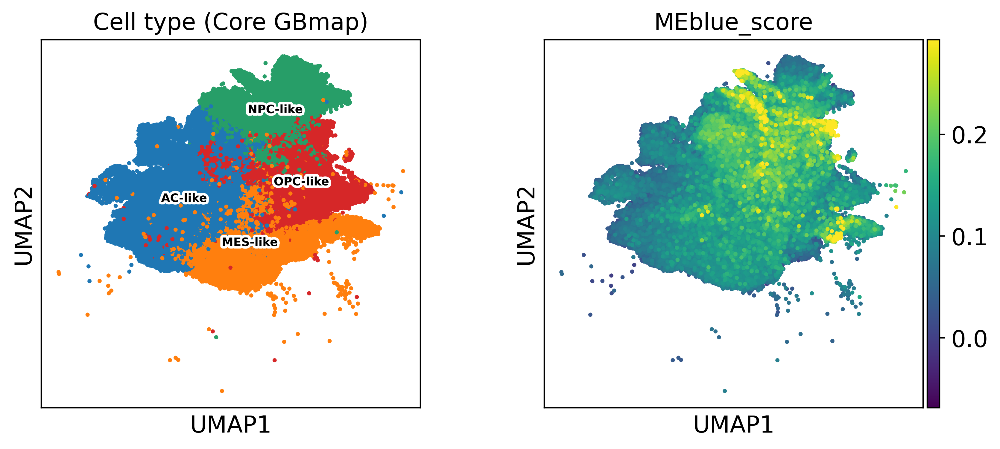

/opt/conda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


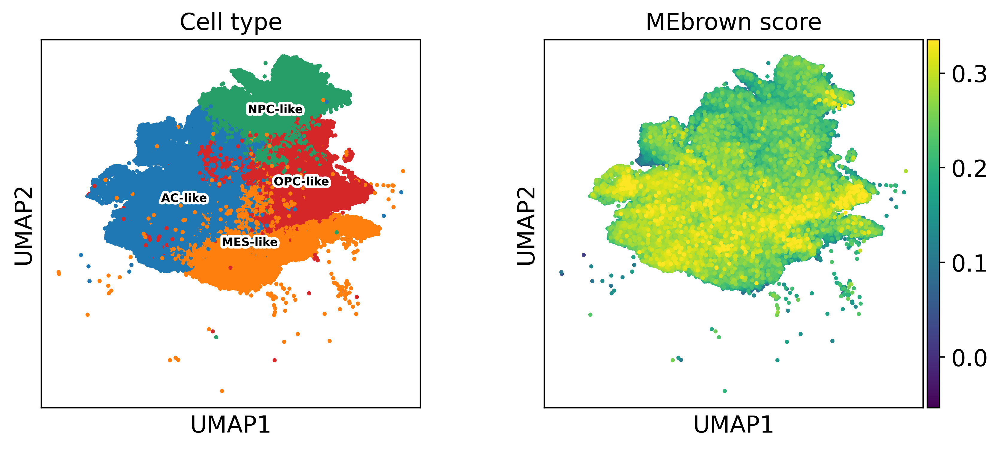

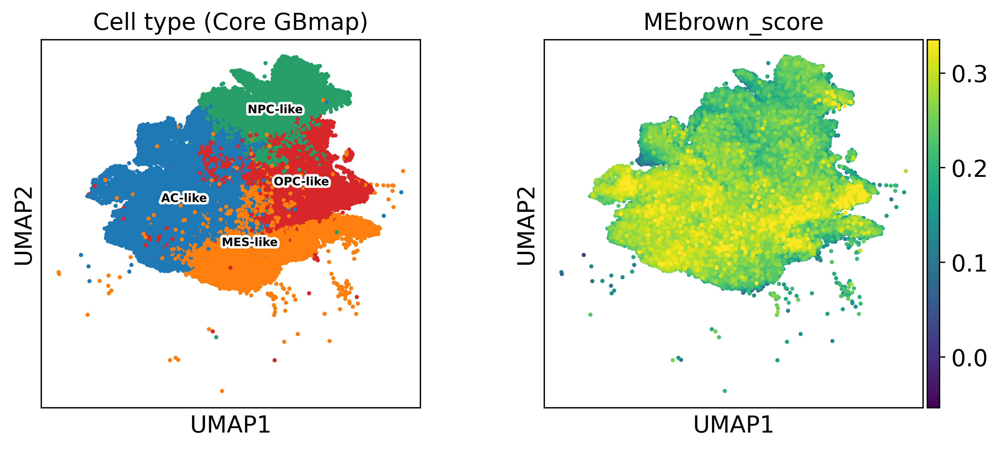

/opt/conda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


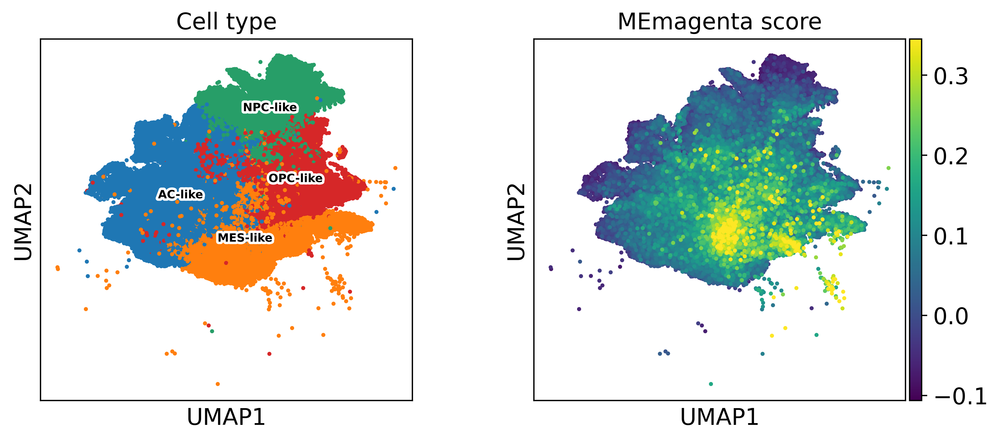

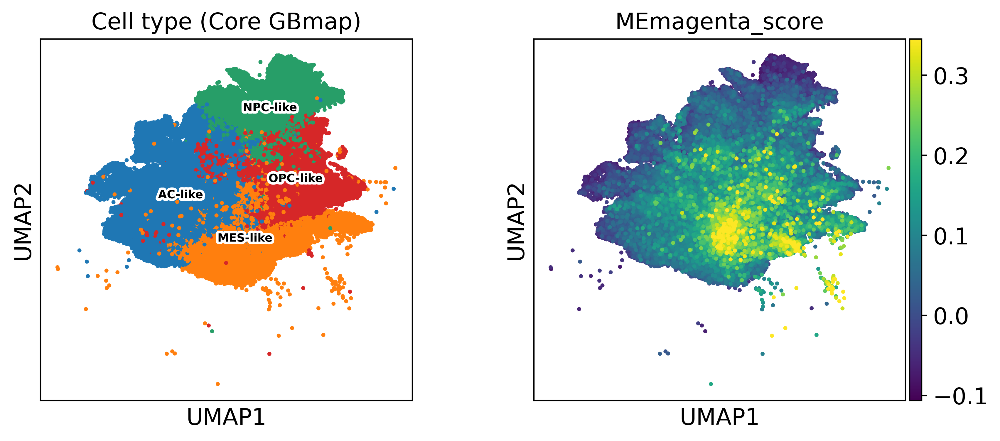

/opt/conda/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


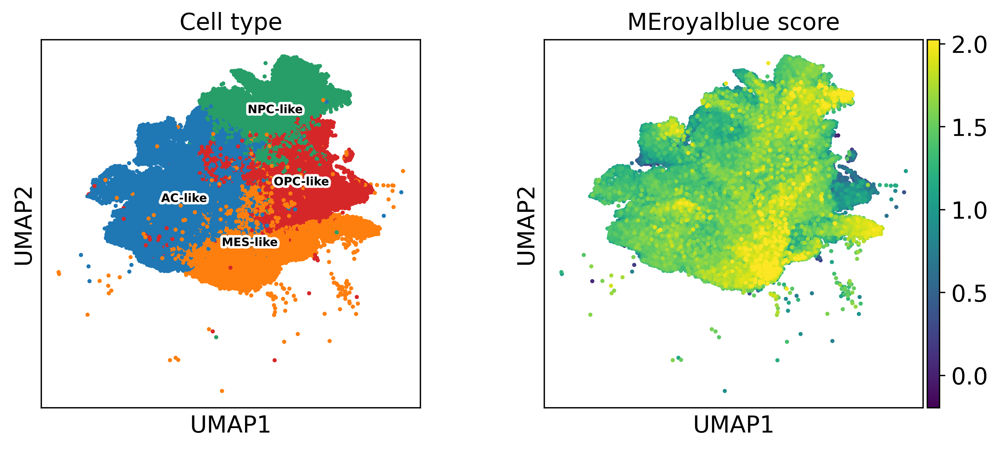

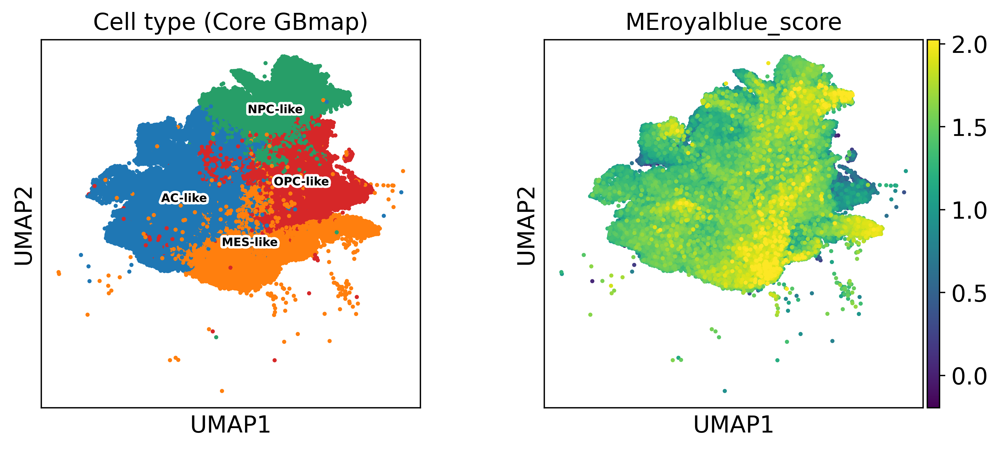

In [31]:
for module in modules:
    module_genes = dict_genes[module]
    sc.tl.score_genes(data, gene_list=[gene for gene in module_genes if gene in data.var_names], score_name="{}_score".format(module),
                 use_raw=False)
    sc.pl.umap(data, color=["annotation_level_3", "{}_score".format(module)], 
           cmap="viridis", 
           ncols=2,
            # vmax=0.5,
            # vmin=0,
           vmax="p99.9",
           legend_loc="on data",
           legend_fontsize=7, 
           legend_fontoutline=3, 
           s=25, 
           title=["Cell type", "{} score".format(module)], 
           save="core_GBmap_malignantCellsOnly_{}.pdf".format(module))
    sc.pl.umap(data, color=["annotation_level_3", "{}_score".format(module)], 
               cmap="viridis", 
               ncols=2, 
               # vmax=0.5,
               vmax="p99.9", 
               legend_loc="on data",
               legend_fontsize=7, 
               legend_fontoutline=3, 
               s=25, 
               title=["Cell type (Core GBmap)", "{}_score".format(module)],
               save="core_GBmap_titled_malignantCellsOnly_{}.pdf".format(module))


-----